In [1]:
# Importing some important libraries
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [2]:
# Reading the csv file
df = pd.read_csv("https://raw.githubusercontent.com/aniruddhachoudhury/Red-Wine-Quality/master/winequality-red.csv")

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
# Profile Report
ProfileReport(df)

In [5]:
x = df.drop(columns='quality')

In [6]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [7]:
y = df['quality']

In [8]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

### Tain test split

In [9]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=300)

In [12]:
# DecisionTreeClassifier object
dt_model = DecisionTreeClassifier()

In [13]:
# Training model
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [14]:
# Making prediction
pred = dt_model.predict(x_test)

In [15]:
# Checking accuracy score
dt_model.score(x_test,y_test)

0.609375

In [16]:
# creating confucion matric
confusion_matrix(y_test,pred)

array([[ 0,  1,  3,  1,  0,  0],
       [ 0,  0,  5,  4,  1,  0],
       [ 0,  3, 92, 34,  3,  0],
       [ 0,  1, 32, 80, 11,  1],
       [ 0,  1,  5, 14, 23,  3],
       [ 0,  0,  2,  0,  0,  0]], dtype=int64)

In [17]:
# DecisionTreeClassifier model using entropy
dt_en = DecisionTreeClassifier(criterion="entropy")

In [18]:
# training
dt_en.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [19]:
# checking score
dt_en.score(x_test,y_test)

0.603125

In [24]:
# exporting model tree related information and saving it into a file
outfile = dot_for_dt_en = open("dt_en_meta.dot",'w')
tree.export_graphviz(dt_en,out_file=outfile,feature_names=x.columns)

In [25]:
ls

 Volume in drive C is OS
 Volume Serial Number is B4B1-1DA2

 Directory of C:\Users\aniyant\python\Ineuron\Ineuron Previous Batch Lec\ML and EDA

20-Oct-22  04:31 PM    <DIR>          .
20-Oct-22  04:31 PM    <DIR>          ..
14-Oct-22  03:26 PM    <DIR>          .ipynb_checkpoints
07-Sep-22  03:40 PM               548 admission_model.pkl
22-Jun-22  12:30 PM            16,085 Admission_Prediction.csv
20-Jun-22  06:44 PM         1,697,600 ads.html
20-Oct-22  04:31 PM        11,955,440 DecisionTree.ipynb
20-Oct-22  04:32 PM            63,088 dt_en_meta.dot
28-Aug-22  10:10 AM        18,165,424 EDA.ipynb
13-Jun-22  02:55 PM            51,260 FitBit data.csv
27-Aug-22  07:56 PM        19,156,131 FitBit_EDA _And_Feature Engineering.ipynb
20-Jun-22  07:34 PM               452 linear.sav
07-Sep-22  04:10 PM            48,637 LInear_Ridge_Lasso_ElasticNet.ipynb
07-Sep-22  03:04 PM            32,447 LinearRegression.ipynb
09-Sep-22  05:37 PM        11,991,729 Logistics regression implementatio

In [27]:
# importing few more libraries
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [28]:
sklearn.__version__

'0.23.2'

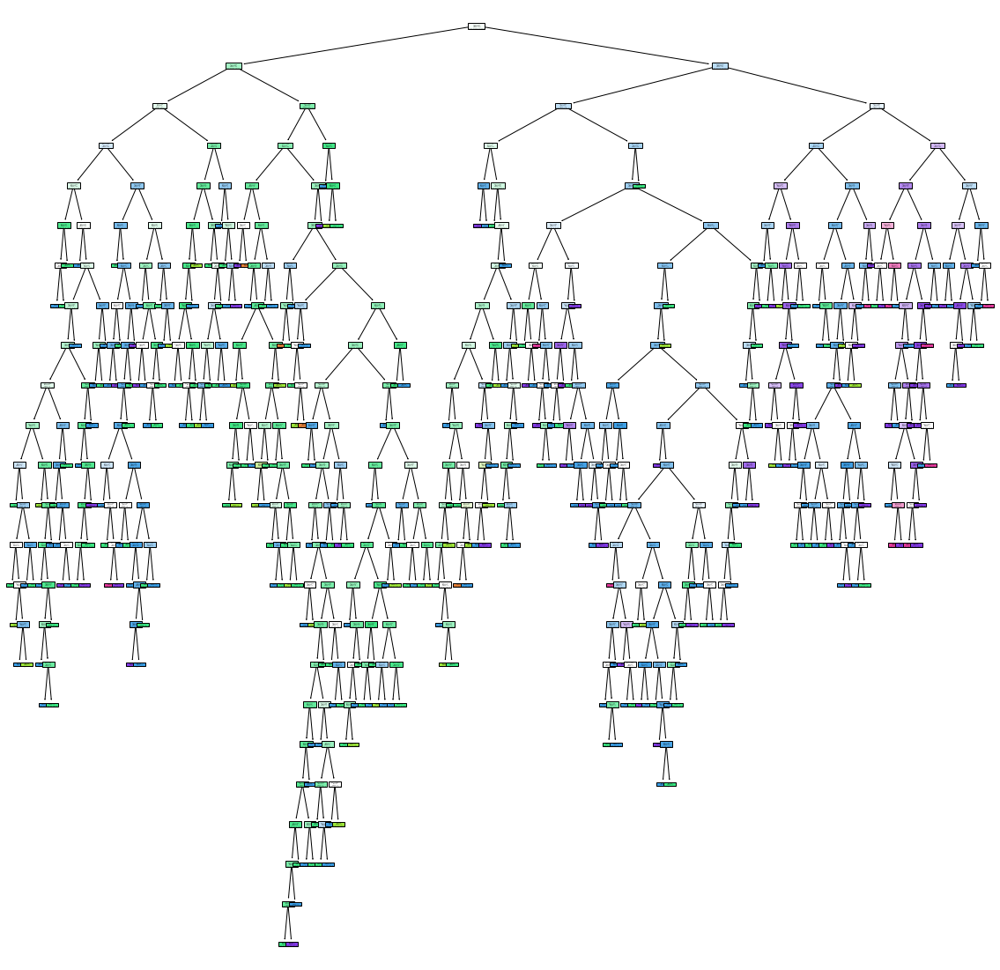

In [30]:
# creating the tree structure 
plt.figure(figsize=(20,20))
tp = tree.plot_tree(dt_model,filled=True)

In [34]:
# This shows information of tree structure 
tp

[Text(531.287085196011, 1064.55, 'X[10] <= 10.25\ngini = 0.639\nsamples = 1279\nvalue = [5, 43, 549, 513, 153, 16]'),
 Text(255.23231172627234, 1019.25, 'X[1] <= 0.548\ngini = 0.507\nsamples = 665\nvalue = [3, 22, 417, 208, 14, 1]'),
 Text(171.70460797799174, 973.95, 'X[6] <= 60.5\ngini = 0.551\nsamples = 297\nvalue = [0, 7, 151, 129, 9, 1]'),
 Text(110.0777166437414, 928.6500000000001, 'X[9] <= 0.645\ngini = 0.555\nsamples = 205\nvalue = [0, 5, 82, 109, 8, 1]'),
 Text(73.81155433287482, 883.35, 'X[9] <= 0.465\ngini = 0.552\nsamples = 113\nvalue = [0, 4, 59, 47, 3, 0]'),
 Text(62.93810178817056, 838.05, 'X[1] <= 0.41\ngini = 0.153\nsamples = 12\nvalue = [0, 0, 11, 1, 0, 0]'),
 Text(58.84456671251719, 792.75, 'X[9] <= 0.435\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(54.75103163686382, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1, 0, 0]'),
 Text(62.93810178817056, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(67.03163686382393, 792.75, 

In [48]:
# take sample of df
sample = df.head(50)

In [49]:
x_sample = sample.drop(columns= 'quality')

In [50]:
y_sample = sample.quality

In [51]:
sample_dt = DecisionTreeClassifier()

In [52]:
# training on sample data
sample_dt.fit(x_sample,y_sample)

DecisionTreeClassifier()

[Text(462.09375, 1032.8400000000001, 'sulphates <= 0.515\ngini = 0.538\nsamples = 50\nvalue = [4, 32, 10, 4]\nclass = 5'),
 Text(209.25, 924.1200000000001, 'sulphates <= 0.475\ngini = 0.56\nsamples = 5\nvalue = [3, 1, 0, 1]\nclass = 4'),
 Text(139.5, 815.4000000000001, 'total sulfur dioxide <= 40.0\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 0, 1]\nclass = 5'),
 Text(69.75, 706.6800000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]\nclass = 7'),
 Text(209.25, 706.6800000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]\nclass = 5'),
 Text(279.0, 815.4000000000001, 'gini = 0.0\nsamples = 3\nvalue = [3, 0, 0, 0]\nclass = 4'),
 Text(714.9375, 924.1200000000001, 'alcohol <= 10.55\ngini = 0.471\nsamples = 45\nvalue = [1, 31, 10, 3]\nclass = 5'),
 Text(523.125, 815.4000000000001, 'volatile acidity <= 0.285\ngini = 0.414\nsamples = 42\nvalue = [0, 31, 8, 3]\nclass = 5'),
 Text(348.75, 706.6800000000001, 'sulphates <= 0.665\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1]\nclass = 6')

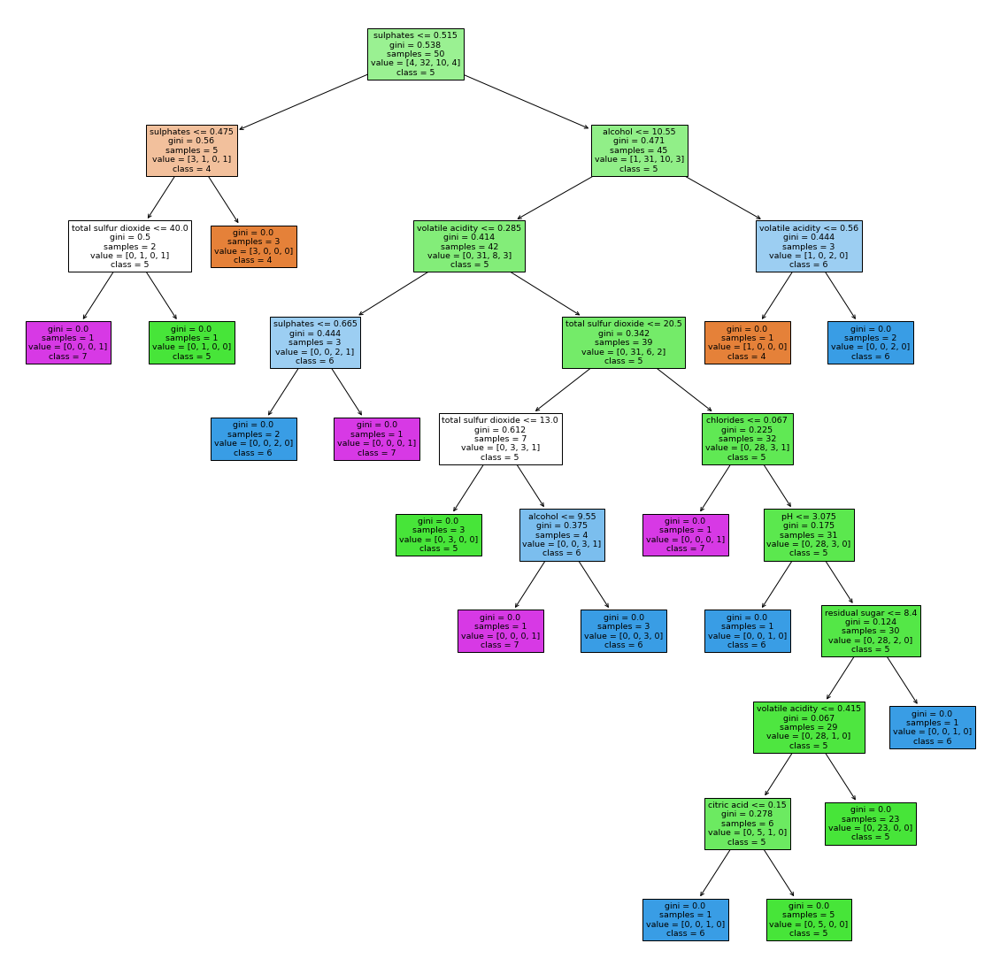

In [53]:
# creating tree structure with features name
plt.figure(figsize=(20,20))
tree.plot_tree(sample_dt,filled=True,class_names= [str(i) for i in set(y_sample)],feature_names = sample.columns)

In [54]:
set(y_sample)

{4, 5, 6, 7}

In [55]:
sample['citric acid'].mean()

0.1932

In [59]:
# accuracy score of decision tree on training data
sample_dt.score(x_sample,y_sample)

1.0

In [62]:
# score on testing data
sample_dt.score(x_test,y_test) 

0.3625

In [63]:
# cost complexity 
path = sample_dt.cost_complexity_pruning_path(x_sample,y_sample)

In [66]:
# alphas value for pruning
ccp_alphas = path.ccp_alphas

In [67]:
ccp_alphas

array([0.        , 0.01931034, 0.02      , 0.02666667, 0.02666667,
       0.03      , 0.0348832 , 0.0353629 , 0.036     , 0.04645833,
       0.052     , 0.0576    ])

In [68]:
# creating decisionTreeClassifier model with all the different alpha values we have
dt_models = []
for ccp in ccp_alphas:
    dt = DecisionTreeClassifier(ccp_alpha=ccp)
    dt.fit(x_sample,y_sample)
    dt_models.append(dt)

In [69]:
dt_models

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.01931034482758619),
 DecisionTreeClassifier(ccp_alpha=0.02),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.03),
 DecisionTreeClassifier(ccp_alpha=0.03488320355951059),
 DecisionTreeClassifier(ccp_alpha=0.03536290322580643),
 DecisionTreeClassifier(ccp_alpha=0.036000000000000004),
 DecisionTreeClassifier(ccp_alpha=0.04645833333333334),
 DecisionTreeClassifier(ccp_alpha=0.05200000000000002),
 DecisionTreeClassifier(ccp_alpha=0.05760000000000004)]

In [70]:
train_score = [i.score(x_sample,y_sample)for i in dt_models]

In [71]:
test_score = [i.score(x_test,y_test) for i in dt_models]

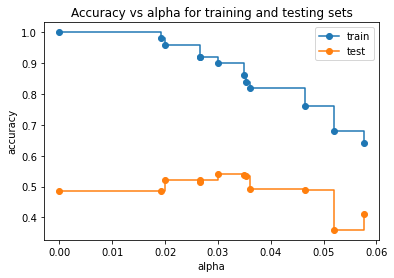

In [73]:
# plotting accuracy of train and test dataset vs aplpha values
fig,ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_score,marker='o',label='train',drawstyle='steps-post')
ax.plot(ccp_alphas,test_score,marker='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

### Observation - As alpha values changes there is changes or increases train and test accuracy came closer so minimizing the overfitting

In [92]:
# creating decision tree with aplha value = 0.055 shown in above figure
dt_model_ccp = DecisionTreeClassifier(ccp_alpha=0.055,random_state=200)

In [93]:
dt_model_ccp.fit(x_sample,y_sample)

DecisionTreeClassifier(ccp_alpha=0.055, random_state=200)

[Text(558.0, 815.4000000000001, 'X[9] <= 0.515\ngini = 0.538\nsamples = 50\nvalue = [4, 32, 10, 4]'),
 Text(279.0, 271.79999999999995, 'gini = 0.56\nsamples = 5\nvalue = [3, 1, 0, 1]'),
 Text(837.0, 271.79999999999995, 'gini = 0.471\nsamples = 45\nvalue = [1, 31, 10, 3]')]

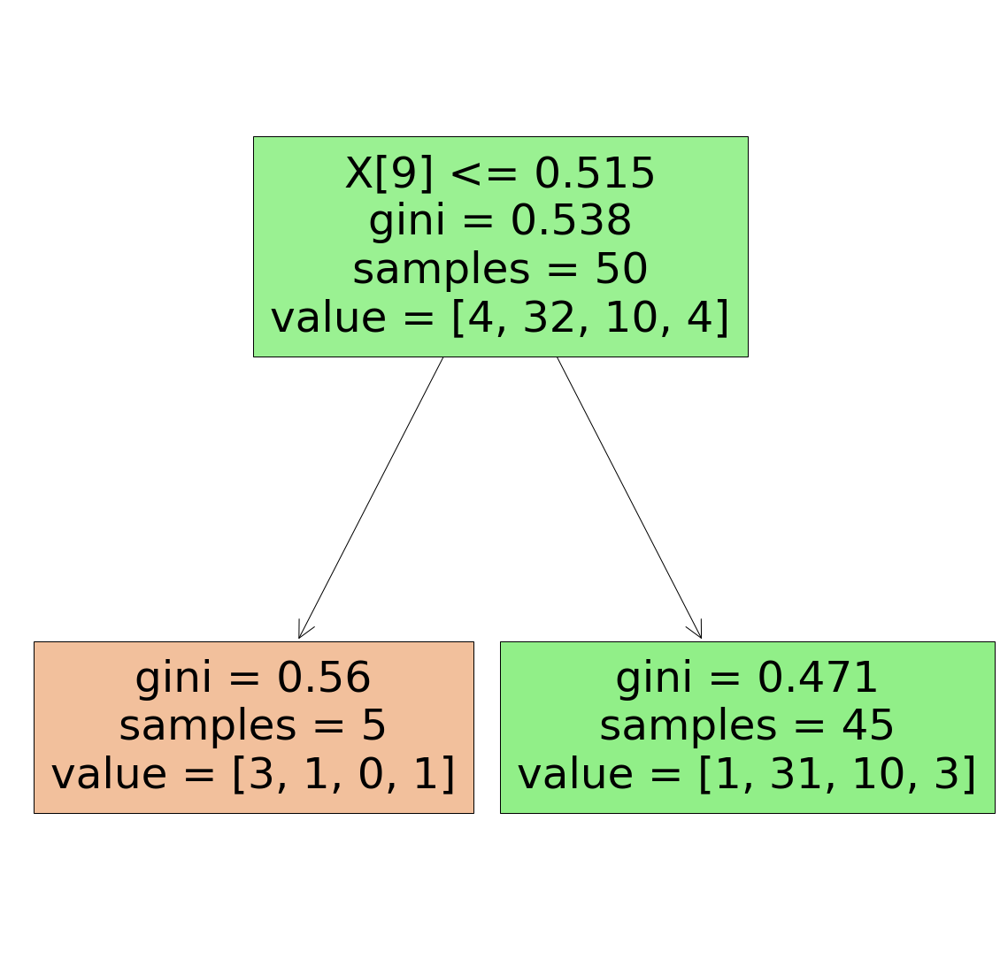

In [94]:
# plotting the tree structure
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [95]:
dt_model_ccp.score(x_sample,y_sample)

0.68

In [96]:
dt_model_ccp.score(x_test,y_test)

0.359375

In [98]:
# hyperparameter tuning
grid_pram = {"criterion" : ["gini","entropy"],
             "splitter" : ['best','random'],
             "max_depth" : range(2,30,1),
             "min_samples_split" : range(2,10,1),
             "min_samples_leaf" : range(1,10,1)
            }

In [99]:
# GridSearchCV for hyperparameter tuning
grid_model = GridSearchCV(estimator=sample_dt,param_grid=grid_pram,cv=5,n_jobs=-1)

In [100]:
# Training the model to find best parameter
grid_model.fit(x_sample,y_sample)

C:\Users\aniyant\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 30),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [102]:
# best parameters found from grid search cv
grid_model.best_params_

{'criterion': 'gini',
 'max_depth': 27,
 'min_samples_leaf': 5,
 'min_samples_split': 4,
 'splitter': 'random'}

In [103]:
# from above paramters creating new model
dt_model_cpp_new = DecisionTreeClassifier(
    criterion="gini",
    max_depth=27,
    min_samples_leaf=5,
    min_samples_split= 4,
    splitter = "random"
)

In [107]:
# training the model
dt_model_cpp_new.fit(x_sample,y_sample)

DecisionTreeClassifier(max_depth=27, min_samples_leaf=5, min_samples_split=4,
                       splitter='random')

In [108]:
dt_model_cpp_new.score(x_sample,y_sample)

0.72

In [106]:
dt_model_cpp_new.score(x_test,y_test)

0.45625

### Observation- Paramter found through GridSearchCV may help in improving accuracy score